# Visualize matches of various methods on example image pairs

_Incase you don't see the plottings, you need to exectue the code section multiple times. (This has happened several times to my jupyter notebook.)_

Normally, different methods require different matching thresholds to achieve their best visual results. The default one is set to 0.5. To improve the visualization of a specific method, you can adjust its setting (mainly match_threshold) inside the 'example' section of its yaml file.

/usr/wiss/zhouq/miniconda3/envs/immatch/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> Visualize matches of patch2pix

Load model method:patch2pix 
Ckpt:../pretrained/patch2pix/patch2pix_pretrained.pth
Initialize Patch2Pix: backbone=ResNet34 cstride=True upsample=8
Init regressor Namespace(conv_dims=[512, 512], conv_kers=[3, 3], conv_strs=[2, 1], fc_dims=[512, 256], feat_comb='pre', feat_dim=259, panc=1, pshift=8, psize=[16, 16], shared=False)
FeatRegressNet:  feat_comb:pre psize:16 out:5 feat_dim:518 conv_kers:[3, 3] conv_dims:[512, 512] conv_str:[2, 1] 
FeatRegressNet:  feat_comb:pre psize:16 out:5 feat_dim:518 conv_kers:[3, 3] conv_dims:[512, 512] conv_str:[2, 1] 
Xavier initialize all model parameters
Initialize ResNet using pretrained model from https://download.pytorch.org/models/resnet34-333f7ec4.pth
Reload all model parameters from weights dict
Initialize Patch2Pix
Plotting inliers:  102


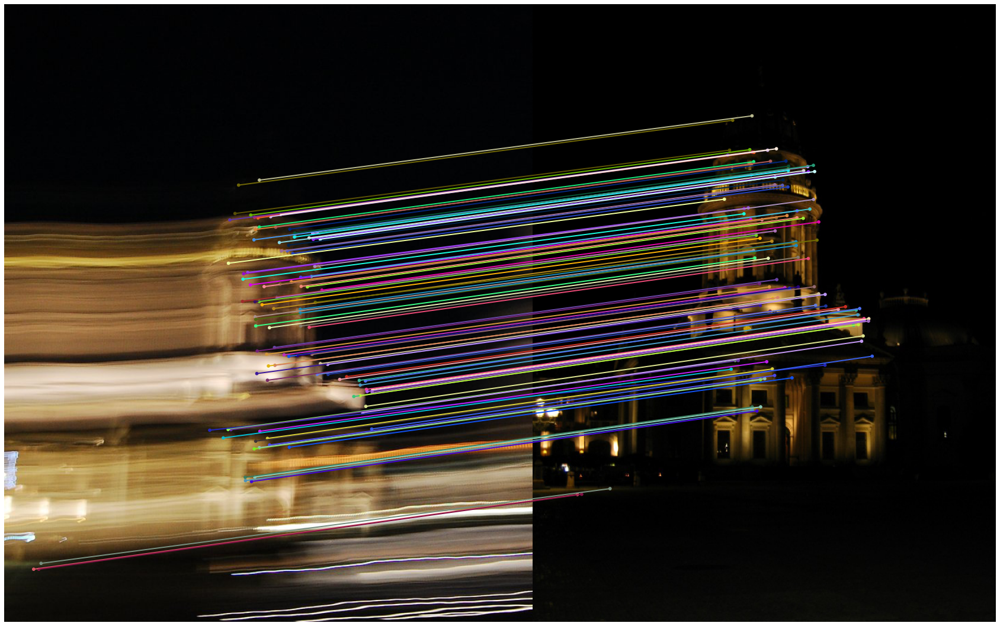


>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> Visualize matches of loftr
Initialize LoFTR
Plotting inliers:  26


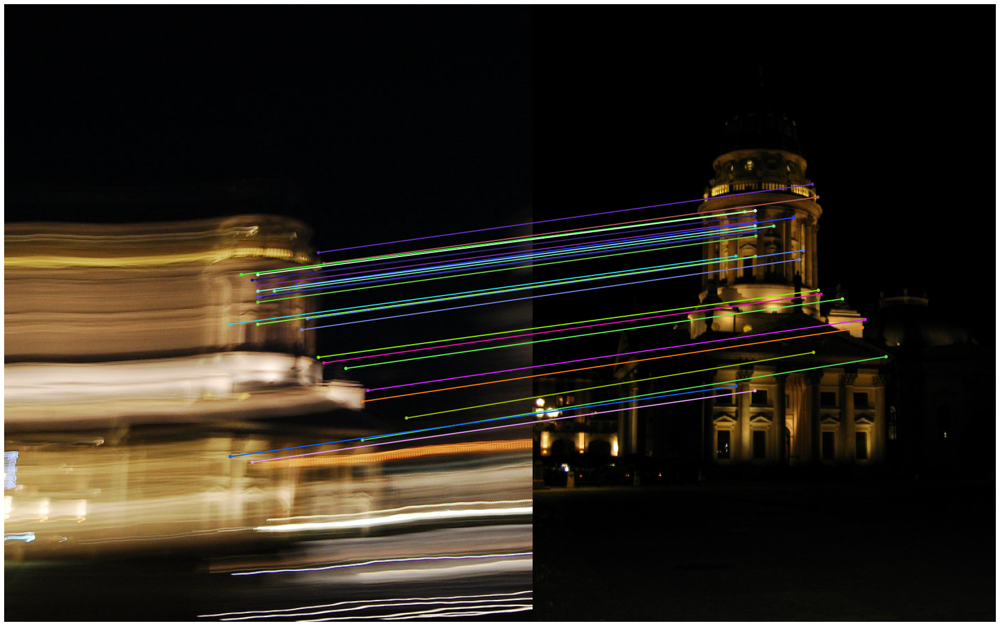


>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> Visualize matches of superglue
Loaded SuperGlue model ("outdoor" weights)
Loaded SuperPoint model
Initialize SuperPoint_r4
Initialize SuperGlue_r4
Plotting inliers:  93


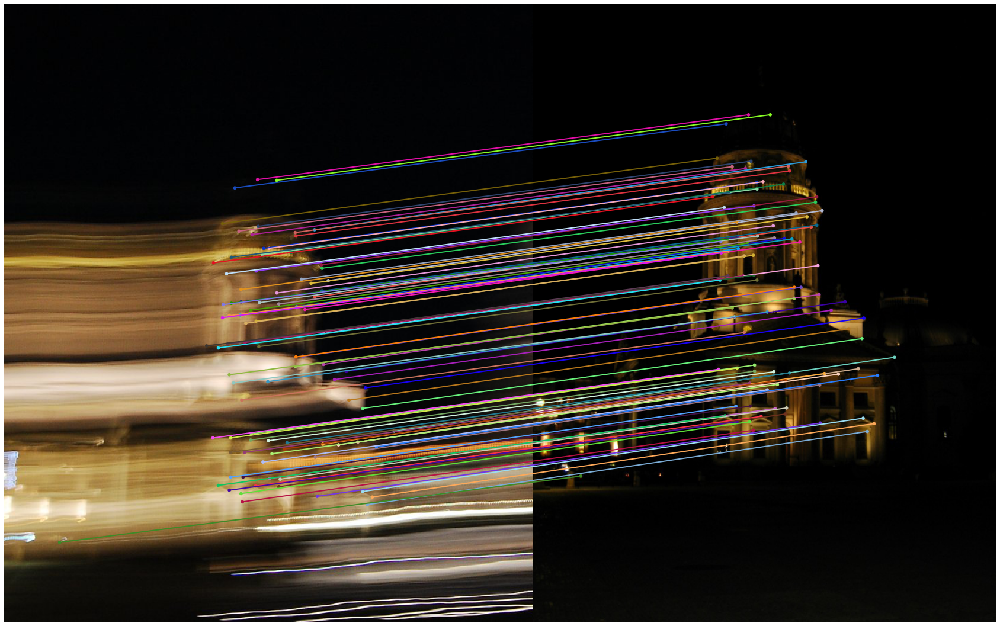


>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> Visualize matches of caps_superpoint
Reloading from ../pretrained/caps/caps-pretrained.pth
Loaded SuperPoint model
Initialize SuperPoint_r4
Initialize CAPS_SuperPoint_r4
Plotting inliers:  90


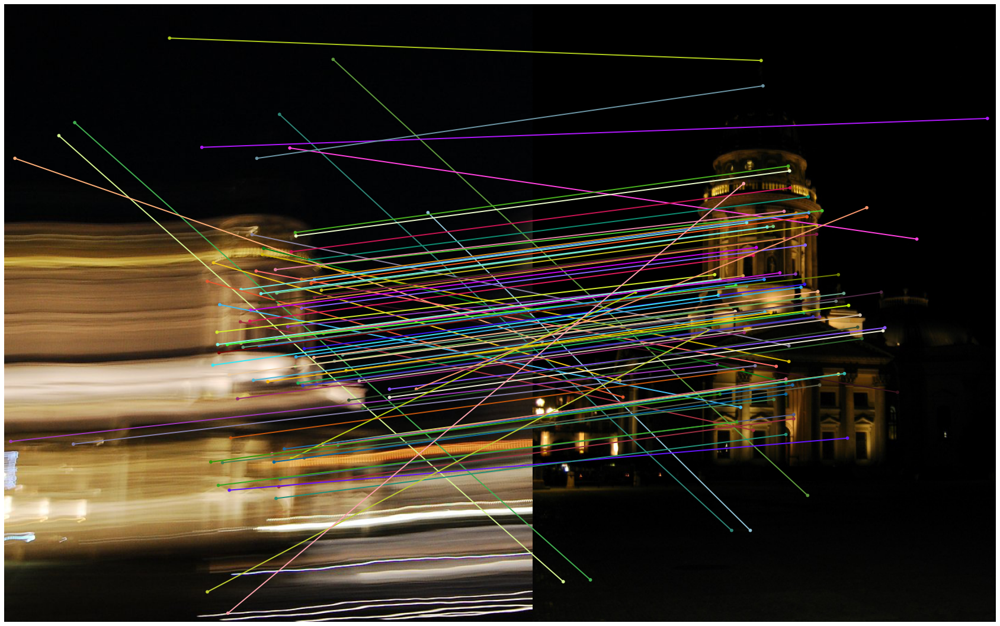


>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> Visualize matches of d2net
Initialize D2Net
Plotting inliers:  266


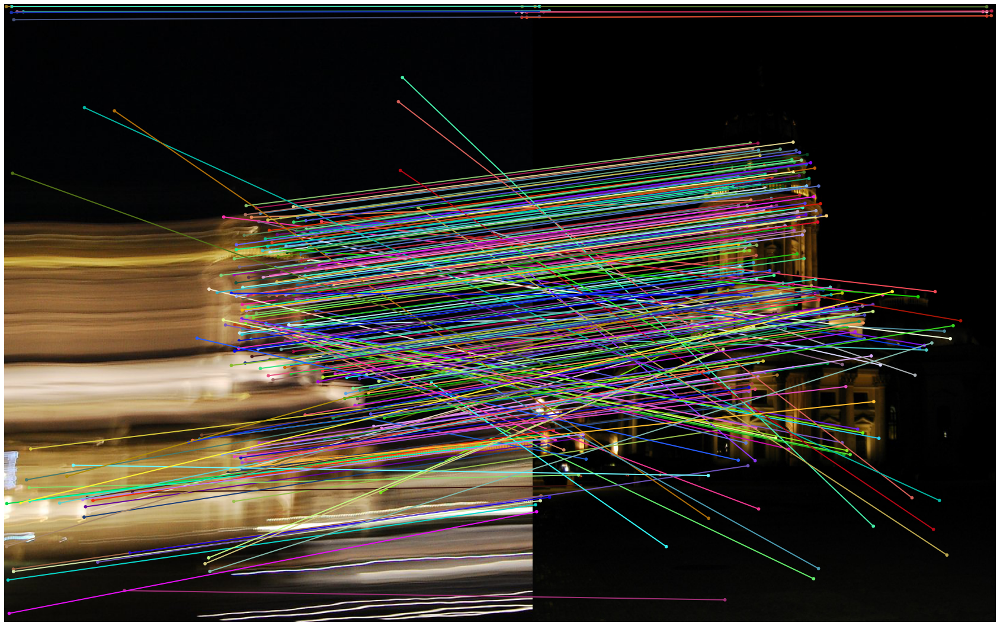


>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> Visualize matches of r2d2
Initialize R2D2
Plotting inliers:  296


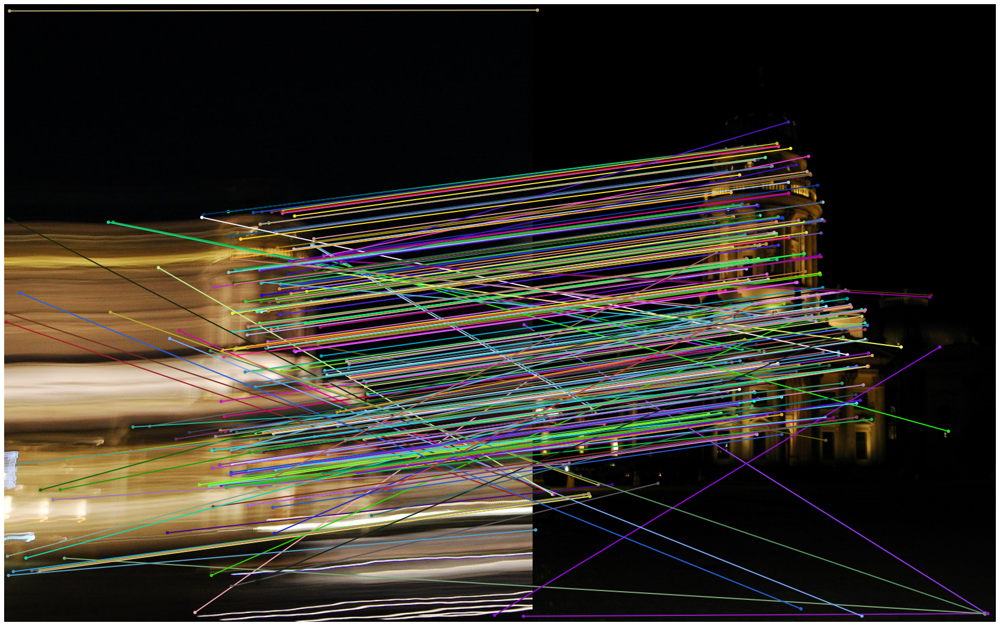

In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import os
import yaml
import immatch
from immatch.utils import plot_matches

for method in [ 'patch2pix', 'loftr', 'superglue', 'caps_superpoint', 'd2net', 'r2d2']:
    print(f'\n>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> Visualize matches of {method}')
    config_file = f'../configs/{method}.yml'
    with open(config_file, 'r') as f:
        
        args = yaml.load(f, Loader=yaml.FullLoader)['example']
        if 'ckpt' in args:
            args['ckpt'] = os.path.join('..', args['ckpt'])
        class_name = args['class']
        
    # Init model
    model = immatch.__dict__[class_name](args)
    matcher = lambda im1, im2: model.match_pairs(im1, im2)
    
    # Put some example image pairs
    im1 = '../third_party/patch2pix/examples/images/pair_2/1.jpg'
    im2 = '../third_party/patch2pix/examples/images/pair_2/2.jpg'

    matches, _, _, _ = matcher(im1, im2)    
    plot_matches(im1, im2, matches, radius=2, lines=True)
